### DCGAN Tutorial
(Author:Nathan Inkawhich)

In [63]:
from __future__ import print_function
import argparse
import os 
import random 
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [46]:
dataroot = "data/celeba"
workers = 4
batch_size = 128
image_size = 64
nc = 3      # Number of channels inthe training images
nz = 100    # Size of generator input
ngf = 64    # Size of feature maps in generator
ndf = 64    # Size of feature maps in discriminator
num_epochs = 5
lr = 0.0002
beta1 = 0.5   # Beta1 hyperparam for Adam Optimizers
ngpu = 1

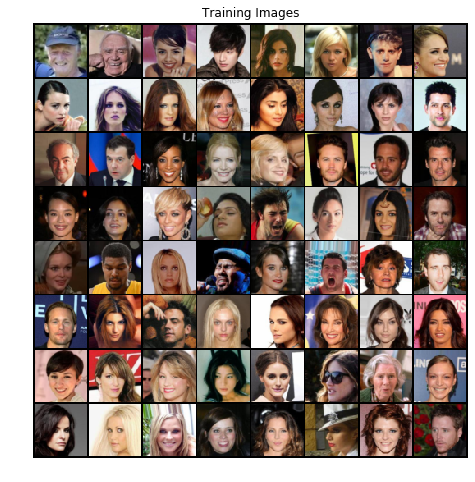

In [47]:
dataset = dset.ImageFolder(root=dataroot,
                          transform = transforms.Compose([
                              transforms.Resize(image_size),
                              transforms.CenterCrop(image_size),
                              transforms.ToTensor(),
                              transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5)),
                          ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size = batch_size, shuffle = True, num_workers = workers)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("Off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64],padding = 2,normalize=True),(1,2,0)))

In [48]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data,0.0,0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0,0.02)
        nn.init.constant_(m.bias.data,0)

In [49]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(nn.ConvTranspose2d(nz,ngf*8,4,1,0,bias = False),
                                 nn.BatchNorm2d(ngf * 8),
                                 nn.ReLU(True),
                                 nn.ConvTranspose2d(ngf * 8, ngf *4, 4,2,1,bias=False),
                                 nn.BatchNorm2d(ngf * 4),
                                 nn.ReLU(True),
                                 nn.ConvTranspose2d(ngf *4, ngf*2, 4,2,1,bias = False),
                                 nn.BatchNorm2d(ngf * 2),
                                 nn.ReLU(True),
                                 nn.ConvTranspose2d(ngf *2, ngf, 4,2,1, bias=False),
                                 nn.BatchNorm2d(ngf),
                                 nn.ReLU(True),
                                 nn.ConvTranspose2d(ngf, nc, 4,2,1,bias=False),
                                 nn.Tanh())
    
    def forward(self,input):
        return self.main(input)

In [50]:
netG = Generator().to(device)
if (device.type=='cuda') and (ngpu>1):
    netG = nn.DataParallel(netG,list(range(ngpu)))

netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [51]:
class Discriminator(nn.Module):
    def __init__(self,ngpu):
        super(Discriminator,self).__init__()
        self.ngpu = ngpu
        self.main=nn.Sequential(nn.Conv2d(nc,ndf,4,2,1,bias = False),
                               nn.LeakyReLU(0.2,inplace=True),
                               nn.Conv2d(ndf, ndf*2,4,2,1,bias=False),
                               nn.BatchNorm2d(ndf*2),
                               nn.LeakyReLU(0.2,inplace =True),
                               nn.Conv2d(ndf *2, ndf*4,4,2,1,bias=False),
                               nn.BatchNorm2d(ndf*4),
                               nn.LeakyReLU(0.2,inplace = True),
                               nn.Conv2d(ndf *4,ndf *8,4,2,1,bias = False),
                               nn.BatchNorm2d(ndf * 8),
                               nn.LeakyReLU(0.2, inplace =True),
                               nn.Conv2d(ndf*8,1,4,1,0,bias=False),
                               nn.Sigmoid())
    def forward(self, input):
        return self.main(input)

In [52]:
netD = Discriminator(ngpu).to(device)
if (device.type=='cuda') and (ngpu>1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [53]:
criterion = nn.BCELoss()
fixed_noise = torch.randn(64,nz,1,1,device=device)
real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1,0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1,0.999))

In [59]:
img_list = []
G_losses = []
D_losses = []
iters = 0
print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader,0):
        # Update D Network
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real=criterion(output,label)
        errD_real.backward()
        D_x = output.mean().item()
        
        noise = torch.randn(b_size,nz,1,1,device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output,label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        # updata G Network
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output,label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        if i% 50 ==0:
            print('[%d/%d][%d/%d]\tLoss_D:%.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)):%.4f/%.4f' %
                 (epoch, num_epochs,i,len(dataloader),errD.item(),errG.item(),D_x,D_G_z1,D_G_z2))
            
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if(iters % 500==0) or ((epoch==num_epochs-1) and (i==len(dataloader)-1)):
            with torch.no_grad():
                fake=netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake,padding=2,normalize=True))
            
        iters += 1
        

Starting Training Loop...
[0/5][0/1583]	Loss_D:0.6949	Loss_G: 6.9450	D(x): 0.8805	D(G(z)):0.3646/0.0016
[0/5][50/1583]	Loss_D:0.0502	Loss_G: 40.7463	D(x): 0.9727	D(G(z)):0.0000/0.0000
[0/5][100/1583]	Loss_D:0.0005	Loss_G: 39.7984	D(x): 0.9995	D(G(z)):0.0000/0.0000
[0/5][150/1583]	Loss_D:0.0009	Loss_G: 39.5992	D(x): 0.9991	D(G(z)):0.0000/0.0000
[0/5][200/1583]	Loss_D:0.0000	Loss_G: 38.9634	D(x): 1.0000	D(G(z)):0.0000/0.0000
[0/5][250/1583]	Loss_D:0.0000	Loss_G: 38.7414	D(x): 1.0000	D(G(z)):0.0000/0.0000
[0/5][300/1583]	Loss_D:0.0000	Loss_G: 37.6513	D(x): 1.0000	D(G(z)):0.0000/0.0000
[0/5][350/1583]	Loss_D:0.0004	Loss_G: 24.2688	D(x): 0.9999	D(G(z)):0.0003/0.0003
[0/5][400/1583]	Loss_D:0.8641	Loss_G: 5.7163	D(x): 0.9666	D(G(z)):0.4887/0.0067
[0/5][450/1583]	Loss_D:1.3189	Loss_G: 3.8639	D(x): 0.8632	D(G(z)):0.5751/0.0437
[0/5][500/1583]	Loss_D:0.7583	Loss_G: 1.4970	D(x): 0.6911	D(G(z)):0.2225/0.2935
[0/5][550/1583]	Loss_D:0.6974	Loss_G: 4.8686	D(x): 0.8669	D(G(z)):0.3790/0.0171
[0/5][600/

[3/5][300/1583]	Loss_D:0.8536	Loss_G: 1.0314	D(x): 0.5339	D(G(z)):0.1155/0.4016
[3/5][350/1583]	Loss_D:1.5321	Loss_G: 1.1172	D(x): 0.2724	D(G(z)):0.0158/0.4030
[3/5][400/1583]	Loss_D:0.8683	Loss_G: 1.4992	D(x): 0.6115	D(G(z)):0.2505/0.2682
[3/5][450/1583]	Loss_D:0.6255	Loss_G: 2.8491	D(x): 0.8066	D(G(z)):0.3012/0.0754
[3/5][500/1583]	Loss_D:0.7273	Loss_G: 3.5716	D(x): 0.8942	D(G(z)):0.4121/0.0409
[3/5][550/1583]	Loss_D:0.9215	Loss_G: 3.7475	D(x): 0.8923	D(G(z)):0.5062/0.0310
[3/5][600/1583]	Loss_D:0.5472	Loss_G: 2.1447	D(x): 0.7664	D(G(z)):0.2108/0.1499
[3/5][650/1583]	Loss_D:0.5971	Loss_G: 2.3242	D(x): 0.7988	D(G(z)):0.2672/0.1316
[3/5][700/1583]	Loss_D:0.7007	Loss_G: 1.7281	D(x): 0.6323	D(G(z)):0.1603/0.2282
[3/5][750/1583]	Loss_D:0.8889	Loss_G: 3.1964	D(x): 0.8139	D(G(z)):0.4432/0.0596
[3/5][800/1583]	Loss_D:1.1080	Loss_G: 4.3192	D(x): 0.9594	D(G(z)):0.6032/0.0185
[3/5][850/1583]	Loss_D:0.5866	Loss_G: 1.9630	D(x): 0.7415	D(G(z)):0.2176/0.1741
[3/5][900/1583]	Loss_D:0.6777	Loss_G: 2.

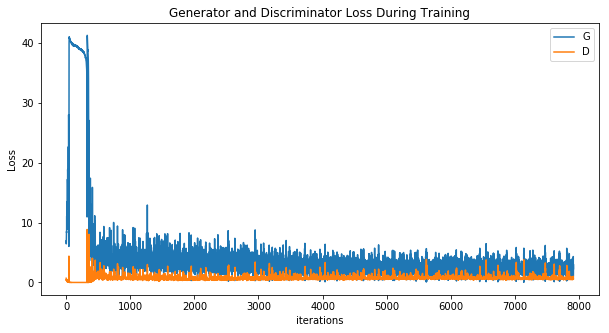

In [61]:
plt.figure(figsize = (10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

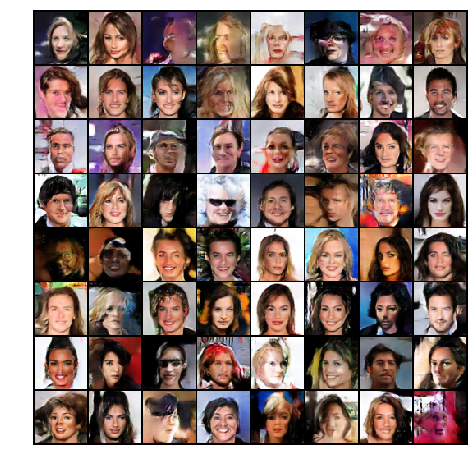

In [64]:
fig = plt.figure(figsize = (8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)),animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

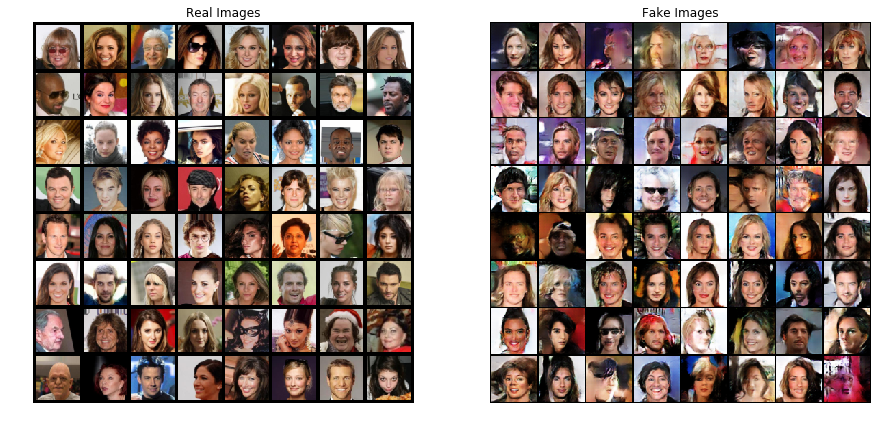

In [65]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64],padding=5,normalize =True),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()